In [18]:
import numpy as np
from PIL import Image 
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import cv2

In [40]:
def full_inverse_filter(image, psf):
    psf_M = psf.shape[0]
    psf_N = psf.shape[1]
    # zero pad the psf in space domain to match the image size
    psf_padded = np.zeros_like(image[:, :, 0])
    psf_padded[0:psf_M, 0:psf_N] = psf
    psf_padded = psf_padded / np.sum(psf_padded)

    result = np.zeros_like(image)

    # compute dft of psf - H
    psf_dft = dft_2d(psf_padded)
    # replace 0 value if present in H, to avoid division by zero
    psf_dft[psf_dft == 0] = 0.00001

    # compute F = G/H for each channel i.e. R, G and B separately
    for i in range(0, 3):
        image_dft = dft_2d(image[:, :, i])
        temp = np.abs(idft_2d(np.divide(image_dft, psf_dft)))
        result[:, :, i] = temp.astype(np.uint8)

    return result

def truncated_inverse_filter(image, psf, R):
    psf_M = psf.shape[0]
    psf_N = psf.shape[1]
    # zero pad the psf in space domain to match the image size
    psf_padded = np.zeros_like(image[:, :, 0])
    psf_padded[0:psf_M, 0:psf_N] = psf
    psf_padded = psf_padded / np.sum(psf_padded)

    result = np.zeros_like(image)
    # compute dft of psf - H
    psf_dft = dft_2d(psf_padded)
    # replace 0 value if present in H, to avoid division by zero
    psf_dft[psf_dft == 0] = 0.00001

    # compute frequency domain Butterworth LPF of order 10 - L
    lpf = get_butterworth_lpf(image.shape[0], image.shape[1], 10, R)
    lpf = shift_dft(lpf)

    # compute F = (G/H)*L for each channel i.e. R, G and B separately
    for i in range(0, 3):
        image_dft = dft_2d(image[:, :, i])
        temp = np.abs(idft_2d(np.multiply(np.divide(image_dft, psf_dft), lpf)))
        result[:, :, i] = temp.astype(np.uint8)

    return result

def weiner_filter(image, psf, K):
    psf_M = psf.shape[0]
    psf_N = psf.shape[1]
    # zero pad the psf in space domain to match the image size
    psf_padded = np.zeros_like(image[:, :, 0])
    psf_padded[0:psf_M, 0:psf_N] = psf
    psf_padded = psf_padded / np.sum(psf_padded)

    result = np.zeros_like(image)
    # compute dft of psf - H
    psf_dft = dft_2d(psf_padded)

    for i in range(0, 3):
        image_dft = dft_2d(image[:, :, i])
        psf_dft_abs = np.square(np.abs(psf_dft))
        temp1 = np.divide(psf_dft_abs, psf_dft_abs + K * np.ones_like(image_dft))
        temp2 = np.divide(image_dft, psf_dft)
        temp = np.abs(idft_2d(np.multiply(temp1, temp2)))
        result[:, :, i] = temp.astype(np.uint8)

    return result


def constrained_ls_filter(image, psf, gamma):
    psf_M = psf.shape[0]
    psf_N = psf.shape[1]
    # zero pad the psf in space domain to match the image size
    psf_padded = np.zeros_like(image[:, :, 0])
    psf_padded[0:psf_M, 0:psf_N] = psf
    psf_padded = psf_padded / np.sum(psf_padded)

    # define laplacian matrix and zero pad it
    laplacian = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]], dtype=int)
    laplacian_padded = np.zeros_like(image[:, :, 0], dtype=int)
    laplacian_padded[0:3, 0:3] = laplacian

    result = np.zeros_like(image)
    # compute dft of psf - H
    psf_dft = dft_2d(psf_padded)
    # compute dft of laplacian - P
    laplacian_dft = dft_2d(laplacian_padded)

    laplacian_dft_abs = np.square(np.abs(laplacian_dft))
    psf_dft_abs = np.square(np.abs(psf_dft))
    temp1 = np.divide(psf_dft_abs, psf_dft_abs + gamma * laplacian_dft_abs)

    # compute F = (G/H) * (|H|^2 / (|H|^2 + gamma * P)) for each channel i.e. R, G and B separately
    for i in range(0, 3):
        image_dft = dft_2d(image[:, :, i])
        temp2 = np.divide(image_dft, psf_dft)
        temp = np.abs(idft_2d(np.multiply(temp1, temp2)))
        result[:, :, i] = temp.astype(np.uint8)

    return result





def get_butterworth_lpf(M, N, order, radius):
    m = range(0, M)
    m0 = int(M / 2) * np.ones(M)
    n = range(0, N)
    n0 = int(N / 2) * np.ones(N)

    r2 = radius ** 2

    # compute butterworth lpf frequency domain representation as 1 / (1 + (x-x0)^2 + (y-y0)^2 / D0^2)^n)
    row = np.tile((np.power(m - m0, 2 * np.ones(M)) / r2).reshape(M, 1), (1, N))
    column = np.tile((np.power(n - n0, 2 * np.ones(N)) / r2).reshape(1, N), (M, 1))

    butterworth_lpf = np.divide(np.ones_like(row),
                                np.power(row + column, order * np.ones_like(row)) + np.ones_like(row))

    return butterworth_lpf


def shift_dft(image):
    shifted_dft = np.fft.fftshift(image)
    return shifted_dft


def dft_2d(image):
    dft = np.fft.fft2(image)
    return dft


def idft_2d(dft):
    idft = np.fft.ifft2(dft)
    return idft

def get_blur_kernel(file_name):
    kernel = Image.open(file_name)
    kernel = np.array(kernel) 
    kernel = kernel[:,:,0]
    return kernel

def read_image(file_name):
    img = Image.open(file_name)
    img = np.array(img) 
    return img[:,:,:]

### weiner_filter

In [41]:
img_blurr = read_image('images/moderate.png')
kernel_a = get_blur_kernel('images/1.jpg')
kernel_b = get_blur_kernel('images/2.jpg')
kernel_c = get_blur_kernel('images/3.jpg')
kernel_d = get_blur_kernel('images/4.jpg')
kernel_e = get_blur_kernel('images/5.jpg')
enhanced_img_a = weiner_filter(img_blurr , kernel_a,.02)
enhanced_img_a = cv2.cvtColor(enhanced_img_a, cv2.COLOR_BGR2RGB)
enhanced_img_b = weiner_filter(img_blurr , kernel_b,.02)
enhanced_img_b = cv2.cvtColor(enhanced_img_b, cv2.COLOR_BGR2RGB)
enhanced_img_c = weiner_filter(img_blurr , kernel_c,.02)
enhanced_img_c = cv2.cvtColor(enhanced_img_c, cv2.COLOR_BGR2RGB)
enhanced_img_d = weiner_filter(img_blurr , kernel_d,.02)
enhanced_img_d = cv2.cvtColor(enhanced_img_d, cv2.COLOR_BGR2RGB)
enhanced_img_e = weiner_filter(img_blurr , kernel_e,.02)
enhanced_img_e = cv2.cvtColor(enhanced_img_e, cv2.COLOR_BGR2RGB)

(<matplotlib.axes._subplots.AxesSubplot at 0x7f06a5440208>,
 Text(0.5, 1.0, 'Enhanced Image kernel_e'))

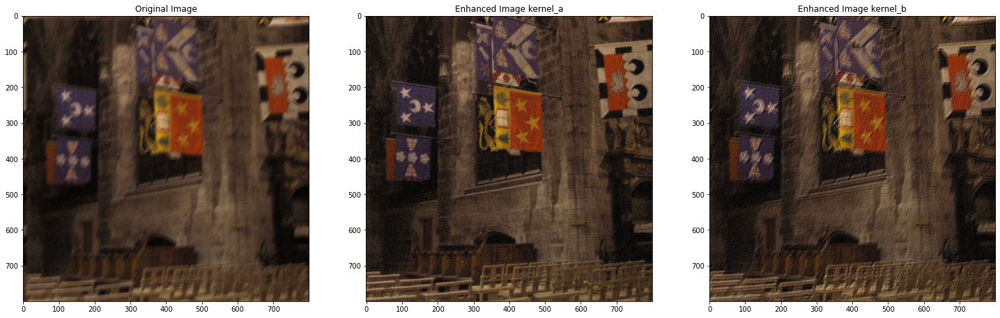

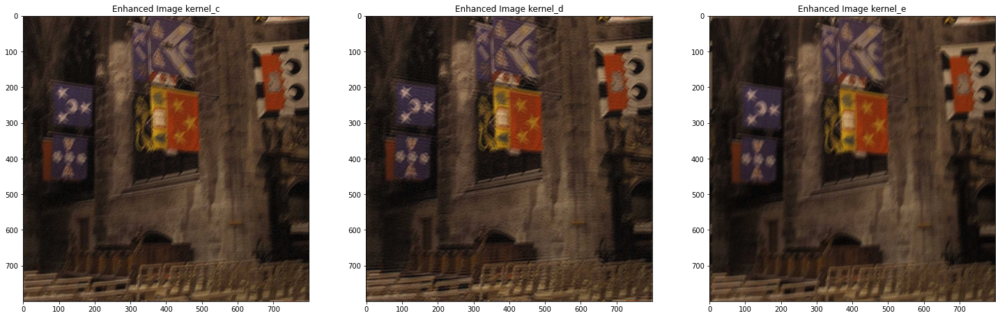

In [42]:
plt.figure(figsize=(25,25))
plt.subplot(131), plt.imshow(img_blurr), plt.title("Original Image")
plt.subplot(132), plt.imshow(enhanced_img_a[:,:,::-1]), plt.title("Enhanced Image kernel_a")
plt.subplot(133), plt.imshow(enhanced_img_b[:,:,::-1]), plt.title("Enhanced Image kernel_b")
plt.figure(figsize=(25,25))
plt.subplot(231), plt.imshow(enhanced_img_c[:,:,::-1]), plt.title("Enhanced Image kernel_c")
plt.subplot(232), plt.imshow(enhanced_img_d[:,:,::-1]), plt.title("Enhanced Image kernel_d")
plt.subplot(233), plt.imshow(enhanced_img_e[:,:,::-1]), plt.title("Enhanced Image kernel_e")

### truncated_inverse_filter

In [43]:
img_blurr = read_image('images/moderate.png')
kernel_a = get_blur_kernel('images/1.jpg')
kernel_b = get_blur_kernel('images/2.jpg')
kernel_c = get_blur_kernel('images/3.jpg')
kernel_d = get_blur_kernel('images/4.jpg')
kernel_e = get_blur_kernel('images/5.jpg')
enhanced_img_a = truncated_inverse_filter(img_blurr , kernel_a,100)
enhanced_img_a = cv2.cvtColor(enhanced_img_a, cv2.COLOR_BGR2RGB)
enhanced_img_b = truncated_inverse_filter(img_blurr , kernel_b,100)
enhanced_img_b = cv2.cvtColor(enhanced_img_b, cv2.COLOR_BGR2RGB)
enhanced_img_c = truncated_inverse_filter(img_blurr , kernel_c,100)
enhanced_img_c = cv2.cvtColor(enhanced_img_c, cv2.COLOR_BGR2RGB)
enhanced_img_d = truncated_inverse_filter(img_blurr , kernel_d,100)
enhanced_img_d = cv2.cvtColor(enhanced_img_d, cv2.COLOR_BGR2RGB)
enhanced_img_e = truncated_inverse_filter(img_blurr , kernel_e,100)
enhanced_img_e = cv2.cvtColor(enhanced_img_e, cv2.COLOR_BGR2RGB)

(<matplotlib.axes._subplots.AxesSubplot at 0x7f06a51a3710>,
 Text(0.5, 1.0, 'Enhanced Image kernel_e'))

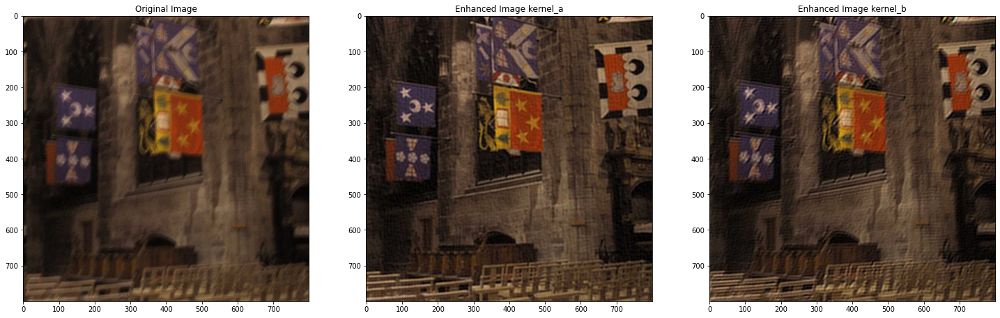

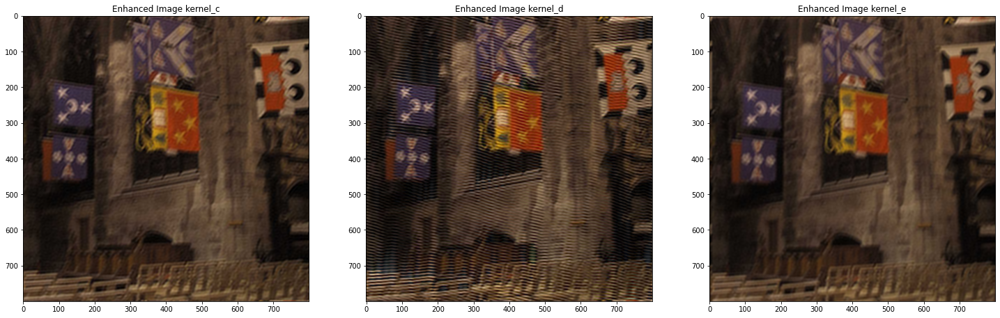

In [44]:
plt.figure(figsize=(25,25))
plt.subplot(131), plt.imshow(img_blurr), plt.title("Original Image")
plt.subplot(132), plt.imshow(enhanced_img_a[:,:,::-1]), plt.title("Enhanced Image kernel_a")
plt.subplot(133), plt.imshow(enhanced_img_b[:,:,::-1]), plt.title("Enhanced Image kernel_b")
plt.figure(figsize=(25,25))
plt.subplot(231), plt.imshow(enhanced_img_c[:,:,::-1]), plt.title("Enhanced Image kernel_c")
plt.subplot(232), plt.imshow(enhanced_img_d[:,:,::-1]), plt.title("Enhanced Image kernel_d")
plt.subplot(233), plt.imshow(enhanced_img_e[:,:,::-1]), plt.title("Enhanced Image kernel_e")

### constrained_ls_filter

In [45]:
img_blurr = read_image('images/moderate.png')
kernel_a = get_blur_kernel('images/1.jpg')
kernel_b = get_blur_kernel('images/2.jpg')
kernel_c = get_blur_kernel('images/3.jpg')
kernel_d = get_blur_kernel('images/4.jpg')
kernel_e = get_blur_kernel('images/5.jpg')
enhanced_img_a = constrained_ls_filter(img_blurr , kernel_a,.1)
enhanced_img_a = cv2.cvtColor(enhanced_img_a, cv2.COLOR_BGR2RGB)
enhanced_img_b = constrained_ls_filter(img_blurr , kernel_b,.1)
enhanced_img_b = cv2.cvtColor(enhanced_img_b, cv2.COLOR_BGR2RGB)
enhanced_img_c = constrained_ls_filter(img_blurr , kernel_c,.1)
enhanced_img_c = cv2.cvtColor(enhanced_img_c, cv2.COLOR_BGR2RGB)
enhanced_img_d = constrained_ls_filter(img_blurr , kernel_d,.1)
enhanced_img_d = cv2.cvtColor(enhanced_img_d, cv2.COLOR_BGR2RGB)
enhanced_img_e = constrained_ls_filter(img_blurr , kernel_e,.1)
enhanced_img_e = cv2.cvtColor(enhanced_img_e, cv2.COLOR_BGR2RGB)

(<matplotlib.axes._subplots.AxesSubplot at 0x7f06a4f83278>,
 Text(0.5, 1.0, 'Enhanced Image kernel_e'))

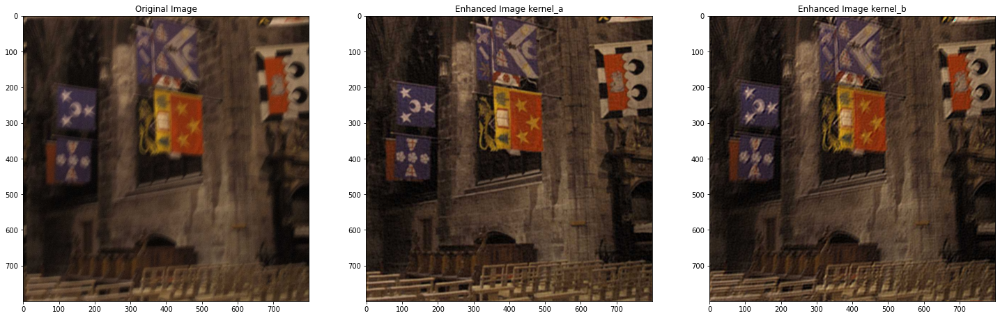

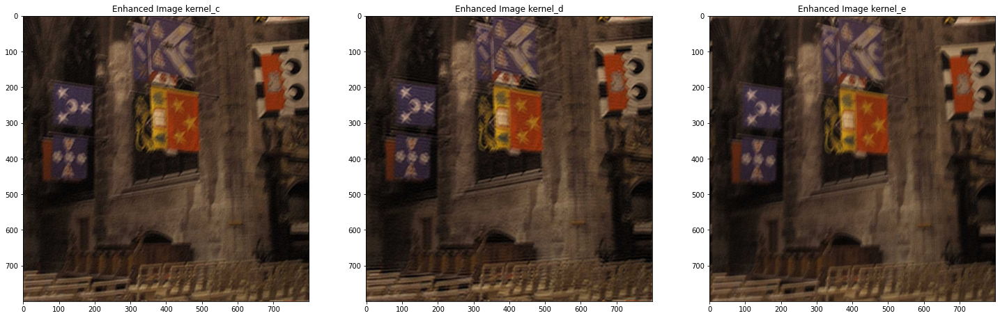

In [46]:
plt.figure(figsize=(25,25))
plt.subplot(131), plt.imshow(img_blurr), plt.title("Original Image")
plt.subplot(132), plt.imshow(enhanced_img_a[:,:,::-1]), plt.title("Enhanced Image kernel_a")
plt.subplot(133), plt.imshow(enhanced_img_b[:,:,::-1]), plt.title("Enhanced Image kernel_b")
plt.figure(figsize=(25,25))
plt.subplot(231), plt.imshow(enhanced_img_c[:,:,::-1]), plt.title("Enhanced Image kernel_c")
plt.subplot(232), plt.imshow(enhanced_img_d[:,:,::-1]), plt.title("Enhanced Image kernel_d")
plt.subplot(233), plt.imshow(enhanced_img_e[:,:,::-1]), plt.title("Enhanced Image kernel_e")

### full_inverse_filter

In [48]:
img_blurr = read_image('images/moderate.png')
kernel_a = get_blur_kernel('images/1.jpg')
kernel_b = get_blur_kernel('images/2.jpg')
kernel_c = get_blur_kernel('images/3.jpg')
kernel_d = get_blur_kernel('images/4.jpg')
kernel_e = get_blur_kernel('images/5.jpg')
enhanced_img_a = full_inverse_filter(img_blurr , kernel_a)
enhanced_img_a = cv2.cvtColor(enhanced_img_a, cv2.COLOR_BGR2RGB)
enhanced_img_b = full_inverse_filter(img_blurr , kernel_b)
enhanced_img_b = cv2.cvtColor(enhanced_img_b, cv2.COLOR_BGR2RGB)
enhanced_img_c = full_inverse_filter(img_blurr , kernel_c)
enhanced_img_c = cv2.cvtColor(enhanced_img_c, cv2.COLOR_BGR2RGB)
enhanced_img_d = full_inverse_filter(img_blurr , kernel_d)
enhanced_img_d = cv2.cvtColor(enhanced_img_d, cv2.COLOR_BGR2RGB)
enhanced_img_e = full_inverse_filter(img_blurr , kernel_e)
enhanced_img_e = cv2.cvtColor(enhanced_img_e, cv2.COLOR_BGR2RGB)

(<matplotlib.axes._subplots.AxesSubplot at 0x7f06a4d406a0>,
 Text(0.5, 1.0, 'Enhanced Image kernel_e'))

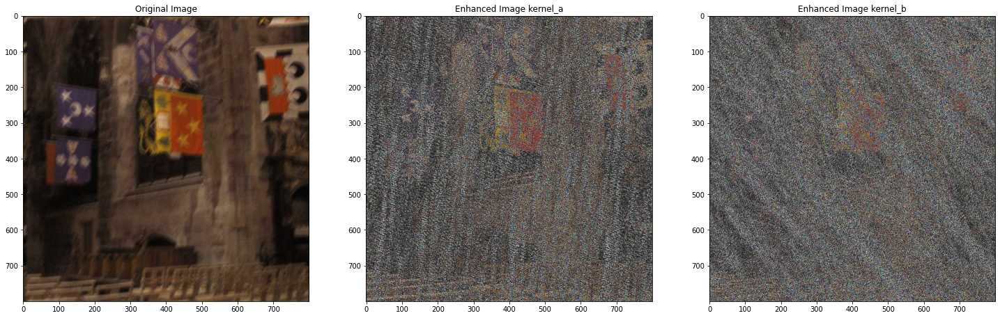

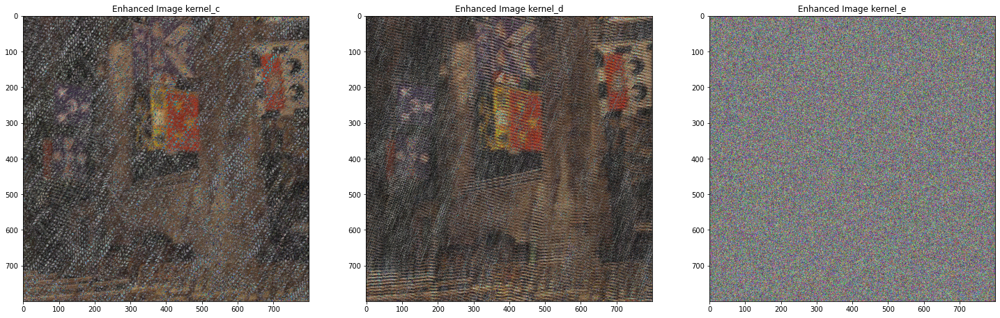

In [49]:
plt.figure(figsize=(25,25))
plt.subplot(131), plt.imshow(img_blurr), plt.title("Original Image")
plt.subplot(132), plt.imshow(enhanced_img_a[:,:,::-1]), plt.title("Enhanced Image kernel_a")
plt.subplot(133), plt.imshow(enhanced_img_b[:,:,::-1]), plt.title("Enhanced Image kernel_b")
plt.figure(figsize=(25,25))
plt.subplot(231), plt.imshow(enhanced_img_c[:,:,::-1]), plt.title("Enhanced Image kernel_c")
plt.subplot(232), plt.imshow(enhanced_img_d[:,:,::-1]), plt.title("Enhanced Image kernel_d")
plt.subplot(233), plt.imshow(enhanced_img_e[:,:,::-1]), plt.title("Enhanced Image kernel_e")